# Example: Calculating equivalent Trx

- This notebook shows an example of how to calculate the equivalent noise temperature of a DESHIMA-like spectrometer using the `deshim` module.
- Note that there is currenlty still a Rayleigh-Jeans approximation in the way T_rx is calculated.

## Setup

In [1]:
# IPython extension to reload modules before executing user code.
%load_ext autoreload
%autoreload 2

## Load Python Modules
import numpy as np
import pandas as pd

## Plotly 
import plotly as py
import plotly.graph_objs as go
import plotly.io as pio
import copy

py.offline.init_notebook_mode(connected=False)
# py.offline.init_notebook_mode(connected=True)

## Matplotlib
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 15 ## font size
%matplotlib inline

# Load desim package
desim_path = '/Users/akira/desim'
import sys
sys.path.append(desim_path)
import desim as dsm # 

# Physical constants
h = 6.62607004 * 10**-34
k = 1.38064852 * 10**-23
e = 1.60217662 * 10**-19 # electron charge
c = 299792458.
Delta_Al = 188 * 10**-6 * e # gap energy of Al
eta_pb = 0.4

# Approximate function based on the values of D2_2V3.pdf, p13
def D2HPBW(F):
    HPBW = 29.*240./(F/1e9) * np.pi / 180. / 60. / 60.
    return HPBW

# Ruze term of main beam efficiency
def eta_mb_ruze(F, LFlimit, sigma):
    '''F in Hz, LFlimit is the eta_mb at => 0 Hz, sigma in m'''
    eta_mb = LFlimit* np.exp(- (4.*np.pi* sigma * F/c)**2. )
    return eta_mb

eta_mb_ruze(np.asarray([350,492])*1e9,0.8,37e-6)

array([ 0.59582916,  0.44691052])

## Minimum Detectable Line Flux

In [2]:
F = np.linspace(100,1000,9001)*1e9 # frequency range
# F = 3.5e11 # single frequency
HPBW = D2HPBW(F)
eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

In [3]:
D2_in ={
    'F' : F,
    'pwv':0.5,
    'EL':60.,
    'R' : 500,
    'eta_M1_spill' : 0.99,
    'eta_M2_spill' : 0.90,
    'eta_wo' : 0.99,
    'eta_co' : 0.65, # product of co spillover, qo filter
    'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
    'eta_circuit' : 0.4, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
    'theta_maj' : HPBW,
    'theta_min' : HPBW,
    'eta_mb' : eta_mb,
    'Tb_cmb' : 2.725,
    'Tp_amb' : 273.,
    'Tp_cabin' : 290.,
    'Tp_co' : 4.,
    'Tp_chip' : 0.12,
    'snr' : 5,
    'obs_hours' :8.,
    'on_source_fraction':0.4
}

In [4]:
D2 = dsm.spectrometer_sensitivity(**D2_in)

# When varying F
ind = (D2['F']-350e9).abs().idxmin()
D2[ind:ind+1].transpose()

# When varying another parameter
# D2.transpose().iloc[:,[0,-1]]

,2500
F,3.500000e+11
PWV,5.000000e-01
EL,6.000000e+01
eta_atm,9.015443e-01
R,5.000000e+02
W_F,1.099557e+09
theta_maj,9.640866e-05
theta_min,9.640866e-05
eta_a,4.756452e-01
eta_mb,5.362462e-01


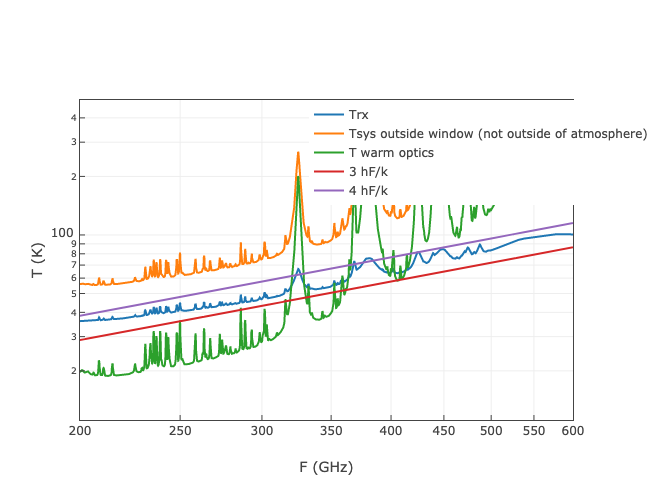

In [20]:
# Interactive plot
cropped = D2[(D2['MDLF'] < 1e-16) & (D2['MDLF'] > 1e-20)]  

tr_Trx = go.Scatter(
        x = cropped['F']/1e9,
        y = cropped['equivalent_Trx'],
        mode='lines',
        name="Trx",
    )

tr_Tsys = go.Scatter(
        x = cropped['F']/1e9,
        y = cropped['equivalent_Trx'] + cropped['Tb_wo'],
        mode='lines',
        name="Tsys outside window (not outside of atmosphere)",
    )

tr_Two = go.Scatter(
        x = cropped['F']/1e9,
        y = cropped['Tb_wo'],
        mode='lines',
        name="T warm optics",
    )

tr_3QN = go.Scatter(
        x = cropped['F']/1e9,
        y = 3*h*cropped['F']/k,
        mode='lines',
        name="3 hF/k",
    )

tr_4QN = go.Scatter(
        x = cropped['F']/1e9,
        y = 4*h*cropped['F']/k,
        mode='lines',
        name="4 hF/k",
    )

data = [tr_Trx,tr_Tsys,tr_Two,tr_3QN,tr_4QN]

layout = py.graph_objs.Layout(
#     title= "snr=" + str(D2['snr'][0]) + ', t_obs=' + str(D2_in['obs_hours'])+' h, t_onsource='+str(D2_in['obs_hours']*D2_in['on_source_fraction'])+' h',
    titlefont = {"size": 15},
    xaxis=dict(
        title='F (GHz)',
        type='log',
        showgrid=True,
        range=np.log10([200, 600]),
        mirror=True,
        ticks='inside',
        showline=True
              ),
    yaxis=dict(title='T (K)',
               type='log',
           showgrid=True,
#            range=[1e-21, 1e-19],
           mirror=True,
           ticks='inside',
           showline=True
              ),
    width=800, height=500,
    showlegend=True
)

fig = py.graph_objs.Figure(data=data, layout=layout)

py.offline.iplot(fig)

# Export plot as files
pio.write_json(fig, desim_path + '/examples/output/equivalent_Trx.plotly')
pio.write_image(fig, desim_path + '/examples/output/equivalent_Trx.pdf')